In [1]:
# Cloning the EDSR Repo
!git clone https://github.com/krasserm/super-resolution.git

# Downloading the Pre-trained model
!wget https://martin-krasser.de/sisr/weights-edsr-16-x4.tar.gz
!tar xvfz weights-edsr-16-x4.tar.gz

### Real-ESRGAN

# Cloning of Real-ESRGAN Repo
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN

# Setting up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

# Downloading the pre-trained model
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P experiments/pretrained_models
    
### BSRGAN
!git clone https://github.com/cszn/BSRGAN.git
    
# Downloading the pre-trained model
!wget https://github.com/cszn/KAIR/releases/download/v1.0/BSRGAN.pth -P BSRGAN/model_zoo

!rm -r SwinIR

### SwinIR
!git clone https://github.com/JingyunLiang/SwinIR.git
!pip install timm

# Downloading the pre-trained model
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth -P experiments/pretrained_models

Cloning into 'super-resolution'...
remote: Enumerating objects: 408, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 408 (delta 0), reused 2 (delta 0), pack-reused 405
Receiving objects: 100% (408/408), 48.16 MiB | 42.81 MiB/s, done.
Resolving deltas: 100% (214/214), done.
--2024-04-10 11:11:51--  https://martin-krasser.de/sisr/weights-edsr-16-x4.tar.gz
Resolving martin-krasser.de (martin-krasser.de)... 217.160.0.142, 2001:8d8:100f:f000::209
Connecting to martin-krasser.de (martin-krasser.de)|217.160.0.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5653330 (5.4M) [application/gzip]
Saving to: 'weights-edsr-16-x4.tar.gz'

weights-edsr-16-x4. 100%[===================>]   5.39M  5.80MB/s    in 0.9s    

2024-04-10 11:11:52 (5.80 MB/s) - 'weights-edsr-16-x4.tar.gz' saved [5653330/5653330]

weights/
weights/edsr-16-x4/
weights/edsr-16-x4/weights.h5
Cloning into 'Real-ESRGAN'...
remote: Enumerating 

In [2]:
import cv2
import numpy as np
import os
import glob
import shutil
import matplotlib.pyplot as plt

In [3]:
test_dir = "/kaggle/input/sr-3000/SR-3000/LR/test/"
lr_dir = 'BSRGAN/testsets/RealSRSet/'
hr_dir = '/OriginalImages/'


if not os.path.isdir('/OriginalImages'):
    os.mkdir('/OriginalImages')
else:
    shutil.rmtree(hr_dir)
    os.mkdir('/OriginalImages')

if not os.path.isdir('BSRGAN/testsets/RealSRSet'):
    os.mkdir('BSRGAN/testsets/RealSRSet')
else:
    shutil.rmtree(lr_dir)
    os.mkdir('BSRGAN/testsets/RealSRSet')
    
    
    

def is_image_file(filename):
    return any(filename.endswith(extension) for extension in ['.png', '.jpg', '.jpeg', '.PNG', '.JPG', '.JPEG'])

lr_img_array_list = []

for img in os.listdir(test_dir)[0:30]:
    if is_image_file(img):
        img_array = cv2.imread(test_dir + img)
        img_array = cv2.resize(img_array, (256,256))
        lr_img_array = cv2.resize(img_array,(128,128))
        lr_img_array_list.append(lr_img_array)
        cv2.imwrite(hr_dir + img, img_array)
        cv2.imwrite(lr_dir + img, lr_img_array)

In [4]:
if  os.path.isdir('/results'):
    shutil.rmtree('/results')
os.mkdir('/results')

In [5]:
### EDSR Model
%cd ..
%cd super-resolution
from model.common import resolve
from model.edsr import edsr
from utils import load_image, plot_sample

model = edsr(scale=4, num_res_blocks=16)

%cd ..
model.load_weights('weights/edsr-16-x4/weights.h5')
sr = resolve(model, lr_img_array_list)

/kaggle/working
/kaggle/working/super-resolution


2024-04-10 11:13:33.264197: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-10 11:13:33.264325: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-10 11:13:33.437157: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


/kaggle/working


In [6]:
# EDSR Results
%cd Real-ESRGAN

results_edsr = '/results/EDSR/'
if not os.path.isdir(results_edsr):
    os.mkdir(results_edsr)

for img,img_array in zip(os.listdir(hr_dir),sr):
    cv2.imwrite(results_edsr + img, img_array.numpy())

/kaggle/working/Real-ESRGAN


In [7]:
# ### Real-ESRGAN 
!python inference_realesrgan.py -n RealESRGAN_x4plus -i 'BSRGAN/testsets/RealSRSet' -o '/results/ESRGAN' --outscale 4 --face_enhance

### BSRGAN
%cd BSRGAN
!python main_test_bsrgan.py
%cd ..
shutil.copytree('BSRGAN/testsets/RealSRSet_results_x4/', '/results/BSRGAN')

### SwinIR
!python SwinIR/main_test_swinir.py --task real_sr --model_path experiments/pretrained_models/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth --folder_lq BSRGAN/testsets/RealSRSet --scale 4
shutil.copytree('results/swinir_real_sr_x4/', '/results/SwinIR')

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
Downloading: "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth" to /kaggle/working/Real-ESRGAN/weights/RealESRGAN_x4plus.pth

100%|███████████████████████████████████████| 63.9M/63.9M [00:00<00:00, 266MB/s]
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13

'/results/SwinIR'

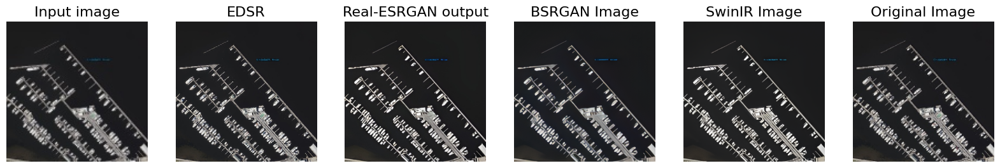

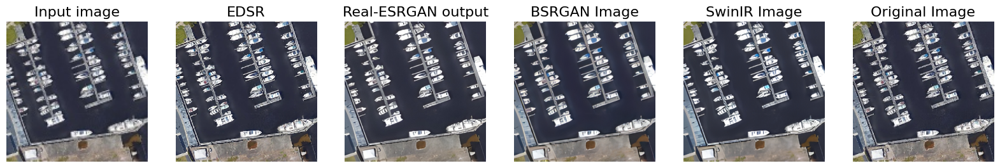

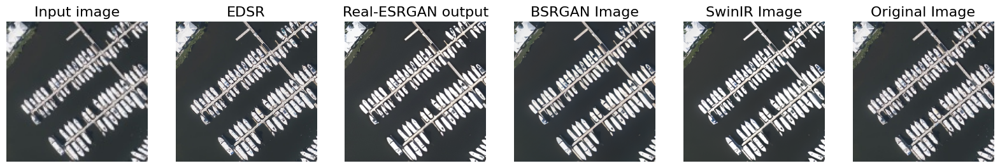

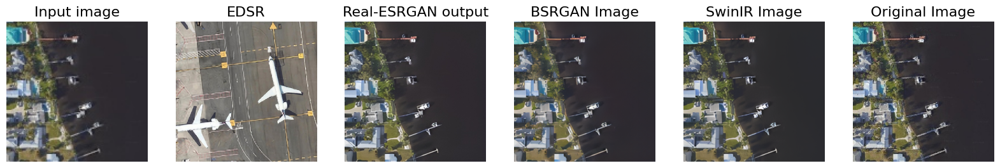

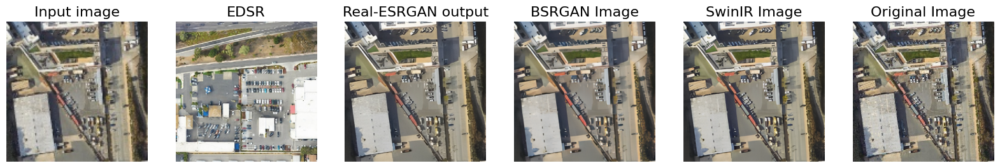

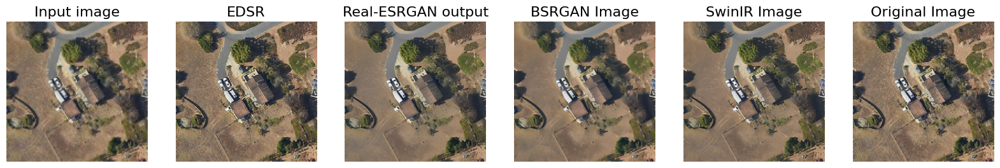

In [8]:
# Display setup
def display(img1, img2, img3, img4, img5, img6):
    
  fig = plt.figure(figsize=(20, 10))

  ax1 = fig.add_subplot(1, 6, 1) 
  plt.title('Input image', fontsize=16)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, 6, 2) 
  plt.title('EDSR', fontsize=16)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, 6, 3)
  plt.title('Real-ESRGAN output', fontsize=16)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, 6, 4)
  plt.title('BSRGAN Image', fontsize=16)
  ax4.axis('off')
  ax5 = fig.add_subplot(1, 6, 5)
  plt.title('SwinIR Image', fontsize=16)
  ax5.axis('off')
  ax6 = fig.add_subplot(1, 6, 6)
  plt.title('Original Image', fontsize=16)
  ax6.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)
  ax5.imshow(img5)
  ax6.imshow(img6)

def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

# Input and results folder
input_folder = 'BSRGAN/testsets/RealSRSet'
original_folder = '/OriginalImages/'
result_edsr = '/results/EDSR/'
result_esrgan = '/results/ESRGAN'
result_bsrgan =  '/results/BSRGAN'
result_swinir = '/results/SwinIR'

input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
output_edsr = sorted(glob.glob(os.path.join(result_edsr, '*')))
output_esrgan = sorted(glob.glob(os.path.join(result_esrgan, '*')))
output_bsrgan = sorted(glob.glob(os.path.join(result_bsrgan, '*')))
output_swinir= sorted(glob.glob(os.path.join(result_swinir, '*')))
# Small subset of input for demo
index_list = [0,1,3,5,17,22]
index_list_edsr = [13,1,15,19,23,3]
demo_inp_list = [input_list[i] for i in index_list]
demo_original_list = [original_list[i] for i in index_list]
demo_out_edsr = [output_edsr[i] for i in index_list_edsr]
demo_out_esrgan = [output_esrgan[i] for i in index_list]
demo_out_bsrgan = [output_bsrgan[i] for i in index_list]
demo_out_swinir = [output_swinir[i] for i in index_list]


# Print images
for input_path,original_path,out_edsr,out_esr,out_bsr,out_swin in zip(demo_inp_list,demo_original_list,demo_out_edsr,demo_out_esrgan,demo_out_bsrgan,demo_out_swinir):
  img_input = imread(input_path)
  img_original = imread(original_path)
  img_edsr = imread(out_edsr)
  img_esr = imread(out_esr)
  img_bsr = imread(out_bsr)
  img_swin = imread(out_swin)
  display(img_input,img_edsr,img_esr,img_bsr,img_swin,img_original)

In [9]:
# import os
# import cv2
# import glob
# import matplotlib.pyplot as plt

# def display(img1, img2, img3, img4, img5):
#     fig = plt.figure(figsize=(20, 10))

#     ax1 = fig.add_subplot(1, 5, 1) 
#     plt.title('Input image', fontsize=16)
#     ax1.axis('off')
#     ax2 = fig.add_subplot(1, 5, 2) 
#     plt.title('EDSR', fontsize=16)
#     ax2.axis('off')
#     ax3 = fig.add_subplot(1, 5, 3)
#     plt.title('BSRGAN Image', fontsize=16)
#     ax3.axis('off')
#     ax4 = fig.add_subplot(1, 5, 4)
#     plt.title('SwinIR Image', fontsize=16)
#     ax4.axis('off')
#     ax5 = fig.add_subplot(1, 5, 5)
#     plt.title('Original Image', fontsize=16)
#     ax5.axis('off')
#     ax1.imshow(img1)
#     ax2.imshow(img2)
#     ax3.imshow(img3)
#     ax4.imshow(img4)
#     ax5.imshow(img5)

# def imread(img_path):
#     img = cv2.imread(img_path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     return img

# # Input and results folder
# input_folder = 'BSRGAN/testsets/RealSRSet'
# original_folder = '/OriginalImages/'
# result_edsr = '/results/EDSR/'
# result_bsrgan = '/results/BSRGAN'
# result_swinir = '/results/SwinIR'

# input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
# original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
# output_edsr = sorted(glob.glob(os.path.join(result_edsr, '*')))
# output_bsrgan = sorted(glob.glob(os.path.join(result_bsrgan, '*')))
# output_swinir = sorted(glob.glob(os.path.join(result_swinir, '*')))

# # Small subset of input for demo
# index_list = [0, 1, 3, 5, 17, 22]
# index_list_edsr = [29, 1, 3, 5, 17, 22]
# demo_inp_list = [input_list[i] for i in index_list]
# demo_original_list = [original_list[i] for i in index_list]
# demo_out_edsr = [output_edsr[i] for i in index_list_edsr]
# demo_out_bsrgan = [output_bsrgan[i] for i in index_list]
# demo_out_swinir = [output_swinir[i] for i in index_list]

# # Print images
# for input_path, original_path, out_edsr, out_bsr, out_swin in zip(demo_inp_list, demo_original_list, demo_out_edsr, demo_out_bsrgan, demo_out_swinir):
#     img_input = imread(input_path)
#     img_original = imread(original_path)
#     img_edsr = imread(out_edsr)
#     img_bsr = imread(out_bsr)
#     img_swin = imread(out_swin)
#     display(img_input, img_edsr, img_bsr, img_swin, img_original)


PSNR (EDSR): 8.042394329964498 SSIM (EDSR): 0.11834875651955029
PSNR (BSRGAN): 24.496415922669655 SSIM (BSRGAN): 0.8721223240885957
PSNR (SwinIR): 21.08827478895888 SSIM (SwinIR): 0.8803138704373443
PSNR (EDSR): 20.6638422706984 SSIM (EDSR): 0.8171933062023011
PSNR (BSRGAN): 23.103135466834317 SSIM (BSRGAN): 0.7927972700379401
PSNR (SwinIR): 21.76957795291832 SSIM (SwinIR): 0.802808806366883
PSNR (EDSR): 9.197434550976048 SSIM (EDSR): 0.17657757540226987
PSNR (BSRGAN): 23.304904220376574 SSIM (BSRGAN): 0.8662012693309334
PSNR (SwinIR): 21.89961142366128 SSIM (SwinIR): 0.870017155769199
PSNR (EDSR): 12.871733099914923 SSIM (EDSR): 0.19717413490639024
PSNR (BSRGAN): 26.763485960016553 SSIM (BSRGAN): 0.8475665602272953
PSNR (SwinIR): 25.763895286078977 SSIM (SwinIR): 0.8339201540471366
PSNR (EDSR): 9.706697310440436 SSIM (EDSR): 0.16519386202999764
PSNR (BSRGAN): 24.487140990387136 SSIM (BSRGAN): 0.7310940154344668
PSNR (SwinIR): 23.73646067868347 SSIM (SwinIR): 0.7428536454234351
PSNR (E

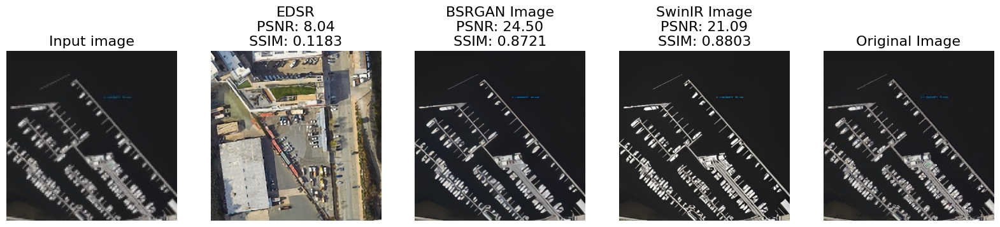

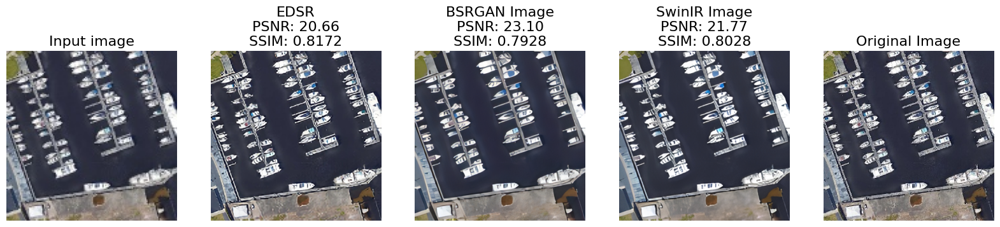

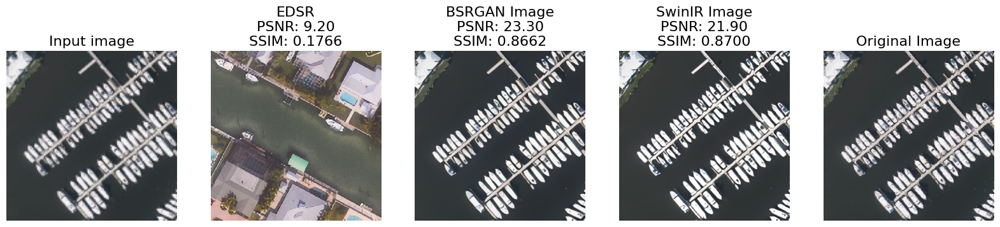

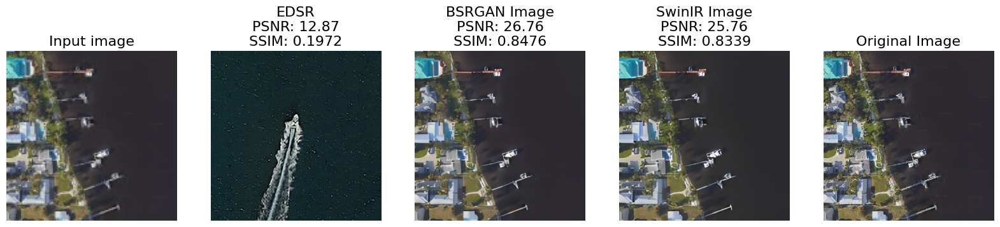

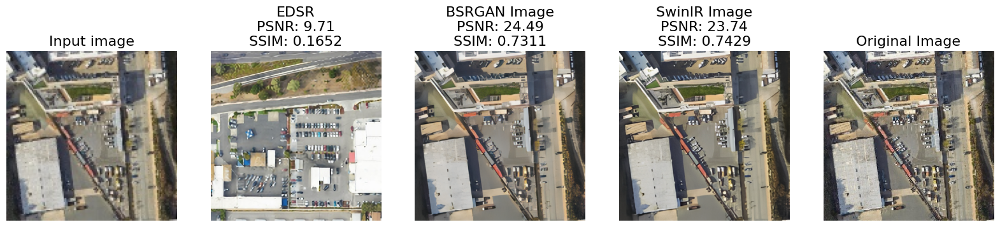

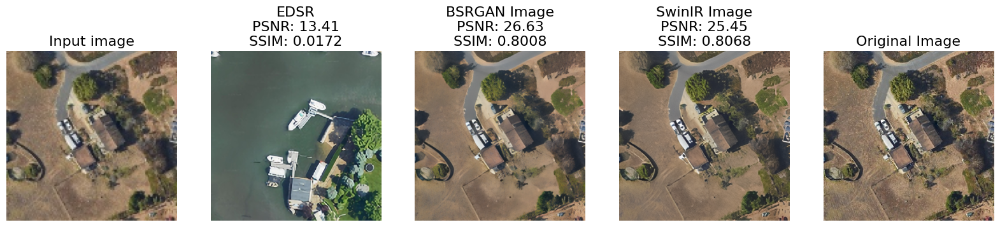

In [10]:
import os
import cv2
import glob
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

def display_with_scores(img1, img2, img3, img4, img5, psnr_edsr, ssim_edsr, psnr_bsr, ssim_bsr, psnr_swin, ssim_swin):
    fig = plt.figure(figsize=(20, 10))

    ax1 = fig.add_subplot(1, 5, 1) 
    plt.title('Input image', fontsize=16)
    ax1.axis('off')
    ax2 = fig.add_subplot(1, 5, 2) 
    plt.title(f'EDSR\nPSNR: {psnr_edsr:.2f}\nSSIM: {ssim_edsr:.4f}', fontsize=16)
    ax2.axis('off')
    ax3 = fig.add_subplot(1, 5, 3)
    plt.title(f'BSRGAN Image\nPSNR: {psnr_bsr:.2f}\nSSIM: {ssim_bsr:.4f}', fontsize=16)
    ax3.axis('off')
    ax4 = fig.add_subplot(1, 5, 4)
    plt.title(f'SwinIR Image\nPSNR: {psnr_swin:.2f}\nSSIM: {ssim_swin:.4f}', fontsize=16)
    ax4.axis('off')
    ax5 = fig.add_subplot(1, 5, 5)
    plt.title('Original Image', fontsize=16)
    ax5.axis('off')
    ax1.imshow(img1)
    ax2.imshow(img2)
    ax3.imshow(img3)
    ax4.imshow(img4)
    ax5.imshow(img5)

def imread(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to calculate PSNR
def calculate_psnr(img1, img2):
    # Resize images to the same dimensions
    img1_resized = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
    return cv2.PSNR(img1_resized, img2)


# Function to calculate SSIM
def calculate_ssim(img1, img2):
    # Resize images to have the same dimensions
    min_height = min(img1.shape[0], img2.shape[0])
    min_width = min(img1.shape[1], img2.shape[1])
    img1_resized = cv2.resize(img1, (min_width, min_height))
    img2_resized = cv2.resize(img2, (min_width, min_height))
    
    # Calculate SSIM with a smaller window size
    return ssim(img1_resized, img2_resized, win_size=3, multichannel=True)



# Input and results folder
input_folder = 'BSRGAN/testsets/RealSRSet'
original_folder = '/OriginalImages/'
result_edsr = '/results/EDSR/'
result_bsrgan = '/results/BSRGAN'
result_swinir = '/results/SwinIR'

input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
output_edsr = sorted(glob.glob(os.path.join(result_edsr, '*')))
output_bsrgan = sorted(glob.glob(os.path.join(result_bsrgan, '*')))
output_swinir = sorted(glob.glob(os.path.join(result_swinir, '*')))

# Small subset of input for demo
index_list = [0, 1, 3, 5, 17, 22]
index_list_edsr = [29, 1, 27, 7, 23, 12]
demo_inp_list = [input_list[i] for i in index_list]
demo_original_list = [original_list[i] for i in index_list]
demo_out_edsr = [output_edsr[i] for i in index_list_edsr]
demo_out_bsrgan = [output_bsrgan[i] for i in index_list]
demo_out_swinir = [output_swinir[i] for i in index_list]

# Print images and calculate PSNR and SSIM
for input_path, original_path, out_edsr, out_bsr, out_swin in zip(demo_inp_list, demo_original_list, demo_out_edsr, demo_out_bsrgan, demo_out_swinir):
    img_input = imread(input_path)
    img_original = imread(original_path)
    img_edsr = imread(out_edsr)
    img_bsr = imread(out_bsr)
    img_swin = imread(out_swin)
    
    # Calculate PSNR
    psnr_edsr = calculate_psnr(img_original, img_edsr)
    psnr_bsr = calculate_psnr(img_original, img_bsr)
    psnr_swin = calculate_psnr(img_original, img_swin)
    
    # Calculate SSIM
    ssim_edsr = calculate_ssim(img_original, img_edsr)
    ssim_bsr = calculate_ssim(img_original, img_bsr)
    ssim_swin = calculate_ssim(img_original, img_swin)
    
    print("PSNR (EDSR):", psnr_edsr, "SSIM (EDSR):", ssim_edsr)
    print("PSNR (BSRGAN):", psnr_bsr, "SSIM (BSRGAN):", ssim_bsr)
    print("PSNR (SwinIR):", psnr_swin, "SSIM (SwinIR):", ssim_swin)
    
    display_with_scores(img_input, img_edsr, img_bsr, img_swin, img_original,
                        psnr_edsr, ssim_edsr, psnr_bsr, ssim_bsr, psnr_swin, ssim_swin)


In [11]:
import os
import cv2
import glob
import numpy as np
from skimage.metrics import structural_similarity as ssim

def imread(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to calculate PSNR
def calculate_psnr(img1, img2):
    # Resize images to the same dimensions
    img1_resized = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
    return cv2.PSNR(img1_resized, img2)

# Function to calculate SSIM
def calculate_ssim(img1, img2):
    # Resize images to have the same dimensions
    min_height = min(img1.shape[0], img2.shape[0])
    min_width = min(img1.shape[1], img2.shape[1])
    img1_resized = cv2.resize(img1, (min_width, min_height))
    img2_resized = cv2.resize(img2, (min_width, min_height))
    
    # Calculate SSIM with a smaller window size
    return ssim(img1_resized, img2_resized, win_size=3, multichannel=True)

def calculate_avg_metrics(model_results_folder, original_folder):
    input_list = sorted(glob.glob(os.path.join(model_results_folder, '*')))
    original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
    
    total_psnr = 0
    total_ssim = 0
    
    for input_path, original_path in zip(input_list, original_list):
        img_result = imread(input_path)
        img_original = imread(original_path)
        
        psnr = calculate_psnr(img_original, img_result)
        ssim_val = calculate_ssim(img_original, img_result)
        
        total_psnr += psnr
        total_ssim += ssim_val
    
    avg_psnr = total_psnr / len(input_list)
    avg_ssim = total_ssim / len(input_list)
    
    return avg_psnr, avg_ssim

# Paths to the folders containing results and original images
result_edsr = '/results/EDSR/'
result_bsrgan = '/results/BSRGAN/'
result_swinir = '/results/SwinIR/'
original_folder = '/OriginalImages/'

# Calculate average metrics for each model
avg_psnr_edsr, avg_ssim_edsr = calculate_avg_metrics(result_edsr, original_folder)
avg_psnr_bsrgan, avg_ssim_bsrgan = calculate_avg_metrics(result_bsrgan, original_folder)
avg_psnr_swinir, avg_ssim_swinir = calculate_avg_metrics(result_swinir, original_folder)

# Print the average metrics for each model
print("Average PSNR (EDSR):", avg_psnr_edsr)
print("Average SSIM (EDSR):", avg_ssim_edsr)
print("Average PSNR (BSRGAN):", avg_psnr_bsrgan)
print("Average SSIM (BSRGAN):", avg_ssim_bsrgan)
print("Average PSNR (SwinIR):", avg_psnr_swinir)
print("Average SSIM (SwinIR):", avg_ssim_swinir)


Average PSNR (EDSR): 10.509000717398774
Average SSIM (EDSR): 0.18539880785033952
Average PSNR (BSRGAN): 25.926088972941326
Average SSIM (BSRGAN): 0.7791297548633463
Average PSNR (SwinIR): 24.992269208159584
Average SSIM (SwinIR): 0.7795889112293303


In [12]:
import os
import cv2
import glob
import numpy as np
from skimage.metrics import structural_similarity as ssim

def imread(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to calculate PSNR
def calculate_psnr(img1, img2):
    # Resize images to 256x256
    img1_resized = cv2.resize(img1, (256, 256))
    img2_resized = cv2.resize(img2, (256, 256))
    return cv2.PSNR(img1_resized, img2_resized)

# Function to calculate SSIM
def calculate_ssim(img1, img2):
    # Resize images to 256x256
    img1_resized = cv2.resize(img1, (256, 256))
    img2_resized = cv2.resize(img2, (256, 256))
    # Calculate SSIM with a smaller window size
    return ssim(img1_resized, img2_resized, win_size=3, multichannel=True)

def calculate_avg_metrics(model_results_folder, original_folder):
    input_list = sorted(glob.glob(os.path.join(model_results_folder, '*')))
    original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
    
    total_psnr = 0
    total_ssim = 0
    
    for input_path, original_path in zip(input_list, original_list):
        img_result = imread(input_path)
        img_original = imread(original_path)
        
        psnr = calculate_psnr(img_original, img_result)
        ssim_val = calculate_ssim(img_original, img_result)
        
        total_psnr += psnr
        total_ssim += ssim_val
    
    avg_psnr = total_psnr / len(input_list)
    avg_ssim = total_ssim / len(input_list)
    
    return avg_psnr, avg_ssim

# Paths to the folders containing results and original images
result_edsr = '/results/EDSR/'
result_bsrgan = '/results/BSRGAN/'
result_swinir = '/results/SwinIR/'
original_folder = '/OriginalImages/'

# Calculate average metrics for each model
avg_psnr_edsr, avg_ssim_edsr = calculate_avg_metrics(result_edsr, original_folder)
avg_psnr_bsrgan, avg_ssim_bsrgan = calculate_avg_metrics(result_bsrgan, original_folder)
avg_psnr_swinir, avg_ssim_swinir = calculate_avg_metrics(result_swinir, original_folder)

# Print the average metrics for each model
print("Average PSNR (EDSR):", avg_psnr_edsr)
print("Average SSIM (EDSR):", avg_ssim_edsr)
print("Average PSNR (BSRGAN):", avg_psnr_bsrgan)
print("Average SSIM (BSRGAN):", avg_ssim_bsrgan)
print("Average PSNR (SwinIR):", avg_psnr_swinir)
print("Average SSIM (SwinIR):", avg_ssim_swinir)


Average PSNR (EDSR): 10.458411646370958
Average SSIM (EDSR): 0.18539880785033952
Average PSNR (BSRGAN): 24.831116772288464
Average SSIM (BSRGAN): 0.7791297548633463
Average PSNR (SwinIR): 24.385302731596656
Average SSIM (SwinIR): 0.7795889112293303


PSNR (EDSR): 8.042394329964498 SSIM (EDSR): 0.11834875651955029
PSNR (ESRGAN): 20.786384643263666 SSIM (ESRGAN): 0.8669896538798729
PSNR (BSRGAN): 24.496415922669655 SSIM (BSRGAN): 0.8721223240885957
PSNR (SwinIR): 21.08827478895888 SSIM (SwinIR): 0.8803138704373443


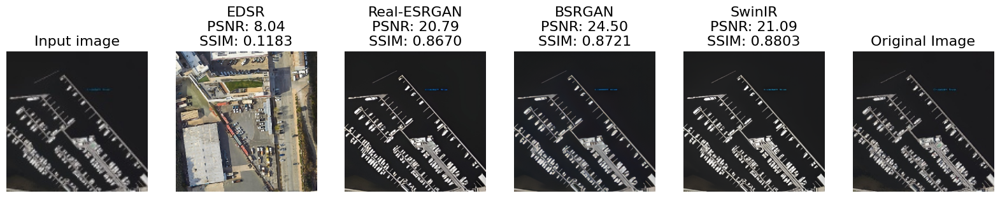

PSNR (EDSR): 20.6638422706984 SSIM (EDSR): 0.8171933062023011
PSNR (ESRGAN): 21.678736561974127 SSIM (ESRGAN): 0.7873743140509611
PSNR (BSRGAN): 23.103135466834317 SSIM (BSRGAN): 0.7927972700379401
PSNR (SwinIR): 21.76957795291832 SSIM (SwinIR): 0.802808806366883


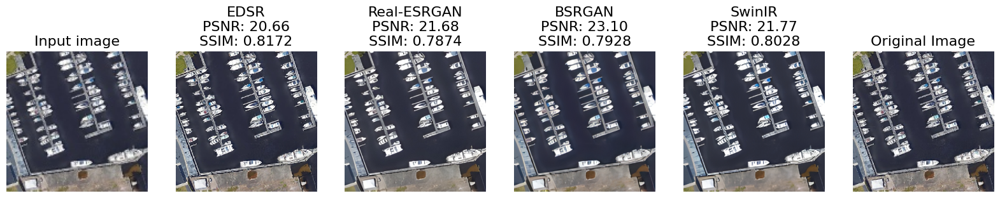

PSNR (EDSR): 9.197434550976048 SSIM (EDSR): 0.17657757540226987
PSNR (ESRGAN): 21.811913441072484 SSIM (ESRGAN): 0.865322532477823
PSNR (BSRGAN): 23.304904220376574 SSIM (BSRGAN): 0.8662012693309334
PSNR (SwinIR): 21.89961142366128 SSIM (SwinIR): 0.870017155769199


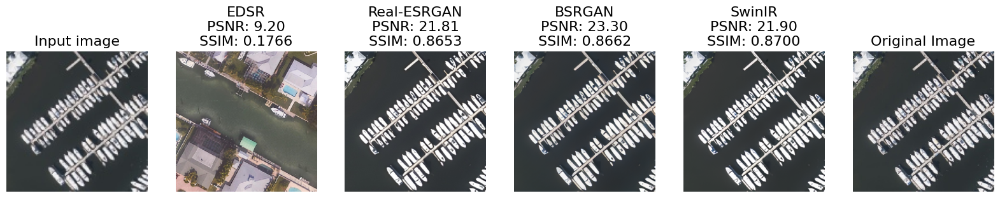

PSNR (EDSR): 12.871733099914923 SSIM (EDSR): 0.19717413490639024
PSNR (ESRGAN): 25.524357774198858 SSIM (ESRGAN): 0.844778846552961
PSNR (BSRGAN): 26.763485960016553 SSIM (BSRGAN): 0.8475665602272953
PSNR (SwinIR): 25.763895286078977 SSIM (SwinIR): 0.8339201540471366


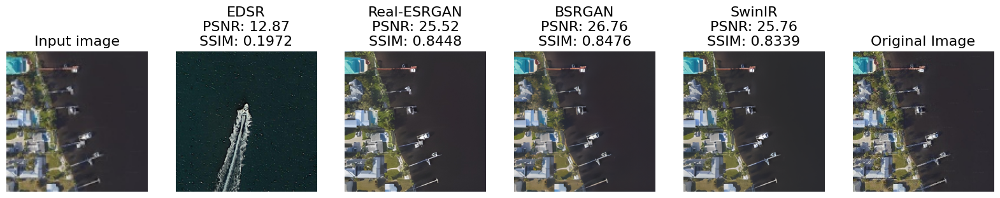

PSNR (EDSR): 9.706697310440436 SSIM (EDSR): 0.16519386202999764
PSNR (ESRGAN): 23.760916216378483 SSIM (ESRGAN): 0.7334201954389294
PSNR (BSRGAN): 24.487140990387136 SSIM (BSRGAN): 0.7310940154344668
PSNR (SwinIR): 23.73646067868347 SSIM (SwinIR): 0.7428536454234351


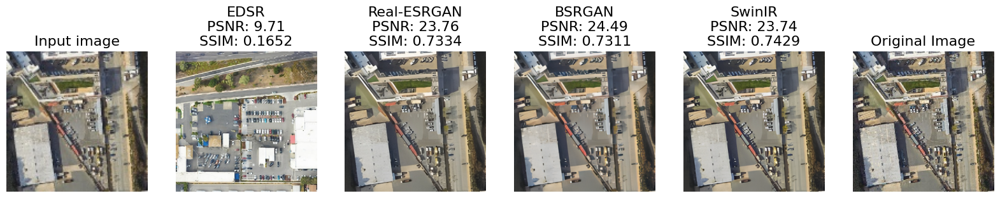

PSNR (EDSR): 13.409379590363574 SSIM (EDSR): 0.017191797525040797
PSNR (ESRGAN): 25.832423051059905 SSIM (ESRGAN): 0.8019874068129021
PSNR (BSRGAN): 26.630173503906114 SSIM (BSRGAN): 0.8007864994252335
PSNR (SwinIR): 25.45493267617639 SSIM (SwinIR): 0.8068177369367192


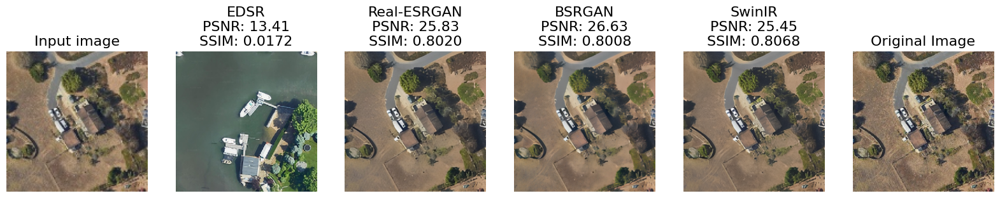

In [13]:
import os
import cv2
import glob
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

def display_with_scores(img1, img2, img3, img4, img5, img6, psnr_edsr, ssim_edsr, psnr_esrgan, ssim_esrgan, psnr_bsr, ssim_bsr, psnr_swin, ssim_swin):
    fig = plt.figure(figsize=(20, 10))

    ax1 = fig.add_subplot(1, 6, 1) 
    plt.title('Input image', fontsize=16)
    ax1.axis('off')
    ax2 = fig.add_subplot(1, 6, 2) 
    plt.title(f'EDSR\nPSNR: {psnr_edsr:.2f}\nSSIM: {ssim_edsr:.4f}', fontsize=16)
    ax2.axis('off')
    ax3 = fig.add_subplot(1, 6, 3)
    plt.title(f'Real-ESRGAN\nPSNR: {psnr_esrgan:.2f}\nSSIM: {ssim_esrgan:.4f}', fontsize=16)
    ax3.axis('off')
    ax4 = fig.add_subplot(1, 6, 4)
    plt.title(f'BSRGAN\nPSNR: {psnr_bsr:.2f}\nSSIM: {ssim_bsr:.4f}', fontsize=16)
    ax4.axis('off')
    ax5 = fig.add_subplot(1, 6, 5)
    plt.title(f'SwinIR\nPSNR: {psnr_swin:.2f}\nSSIM: {ssim_swin:.4f}', fontsize=16)
    ax5.axis('off')
    ax6 = fig.add_subplot(1, 6, 6)
    plt.title('Original Image', fontsize=16)
    ax6.axis('off')
    ax1.imshow(img1)
    ax2.imshow(img2)
    ax3.imshow(img3)
    ax4.imshow(img4)
    ax5.imshow(img5)
    ax6.imshow(img6)
    plt.show()

def imread(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to calculate PSNR
def calculate_psnr(img1, img2):
    # Resize images to the same dimensions
    img1_resized = cv2.resize(img1, (img2.shape[1], img2.shape[0]))
    return cv2.PSNR(img1_resized, img2)


# Function to calculate SSIM
def calculate_ssim(img1, img2):
    # Resize images to have the same dimensions
    min_height = min(img1.shape[0], img2.shape[0])
    min_width = min(img1.shape[1], img2.shape[1])
    img1_resized = cv2.resize(img1, (min_width, min_height))
    img2_resized = cv2.resize(img2, (min_width, min_height))
    
    # Calculate SSIM with a smaller window size
    return ssim(img1_resized, img2_resized, win_size=3, multichannel=True)



# Input and results folder
input_folder = 'BSRGAN/testsets/RealSRSet'
original_folder = '/OriginalImages/'
result_edsr = '/results/EDSR/'
result_bsrgan = '/results/BSRGAN'
result_swinir = '/results/SwinIR'
result_esrgan = '/results/ESRGAN'

input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
output_edsr = sorted(glob.glob(os.path.join(result_edsr, '*')))
output_bsrgan = sorted(glob.glob(os.path.join(result_bsrgan, '*')))
output_swinir = sorted(glob.glob(os.path.join(result_swinir, '*')))
output_esrgan = sorted(glob.glob(os.path.join(result_esrgan, '*')))

# Small subset of input for demo
index_list = [0, 1, 3, 5, 17, 22]
index_list_edsr = [29, 1, 27, 7, 23, 12]
demo_inp_list = [input_list[i] for i in index_list]
demo_original_list = [original_list[i] for i in index_list]
demo_out_edsr = [output_edsr[i] for i in index_list_edsr]
demo_out_bsrgan = [output_bsrgan[i] for i in index_list]
demo_out_swinir = [output_swinir[i] for i in index_list]
demo_out_esrgan = [output_esrgan[i] for i in index_list]

# Print images and calculate PSNR and SSIM
for input_path, original_path, out_edsr, out_esrgan, out_bsr, out_swin in zip(demo_inp_list, demo_original_list, demo_out_edsr, demo_out_esrgan, demo_out_bsrgan, demo_out_swinir):
    img_input = imread(input_path)
    img_original = imread(original_path)
    img_edsr = imread(out_edsr)
    img_esrgan = imread(out_esrgan)
    img_bsr = imread(out_bsr)
    img_swin = imread(out_swin)
    
    # Calculate PSNR
    psnr_edsr = calculate_psnr(img_original, img_edsr)
    psnr_esrgan = calculate_psnr(img_original, img_esrgan)
    psnr_bsr = calculate_psnr(img_original, img_bsr)
    psnr_swin = calculate_psnr(img_original, img_swin)
    
    # Calculate SSIM
    ssim_edsr = calculate_ssim(img_original, img_edsr)
    ssim_esrgan = calculate_ssim(img_original, img_esrgan)
    ssim_bsr = calculate_ssim(img_original, img_bsr)
    ssim_swin = calculate_ssim(img_original, img_swin)
    
    print("PSNR (EDSR):", psnr_edsr, "SSIM (EDSR):", ssim_edsr)
    print("PSNR (ESRGAN):", psnr_esrgan, "SSIM (ESRGAN):", ssim_esrgan)
    print("PSNR (BSRGAN):", psnr_bsr, "SSIM (BSRGAN):", ssim_bsr)
    print("PSNR (SwinIR):", psnr_swin, "SSIM (SwinIR):", ssim_swin)
    
    display_with_scores(img_input, img_edsr, img_esrgan, img_bsr, img_swin, img_original,
                        psnr_edsr, ssim_edsr, psnr_esrgan, ssim_esrgan, psnr_bsr, ssim_bsr, psnr_swin, ssim_swin)


In [14]:
import os
import cv2
import glob
import numpy as np
from skimage.metrics import structural_similarity as ssim

def imread(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Function to calculate PSNR
def calculate_psnr(img1, img2):
    # Resize images to 256x256
    img1_resized = cv2.resize(img1, (256, 256))
    img2_resized = cv2.resize(img2, (256, 256))
    return cv2.PSNR(img1_resized, img2_resized)

# Function to calculate SSIM
def calculate_ssim(img1, img2):
    # Resize images to 256x256
    img1_resized = cv2.resize(img1, (256, 256))
    img2_resized = cv2.resize(img2, (256, 256))
    # Calculate SSIM with a smaller window size
    return ssim(img1_resized, img2_resized, win_size=3, multichannel=True)

def calculate_avg_metrics(model_results_folder, original_folder):
    input_list = sorted(glob.glob(os.path.join(model_results_folder, '*')))
    original_list = sorted(glob.glob(os.path.join(original_folder, '*')))
    
    total_psnr = 0
    total_ssim = 0
    
    for input_path, original_path in zip(input_list, original_list):
        img_result = imread(input_path)
        img_original = imread(original_path)
        
        psnr = calculate_psnr(img_original, img_result)
        ssim_val = calculate_ssim(img_original, img_result)
        
        total_psnr += psnr
        total_ssim += ssim_val
    
    avg_psnr = total_psnr / len(input_list)
    avg_ssim = total_ssim / len(input_list)
    
    return avg_psnr, avg_ssim

# Paths to the folders containing results and original images
result_edsr = '/results/EDSR/'
result_bsrgan = '/results/BSRGAN/'
result_swinir = '/results/SwinIR/'
result_esrgan = '/results/ESRGAN/'
original_folder = '/OriginalImages/'

# Calculate average metrics for each model
avg_psnr_edsr, avg_ssim_edsr = calculate_avg_metrics(result_edsr, original_folder)
avg_psnr_bsrgan, avg_ssim_bsrgan = calculate_avg_metrics(result_bsrgan, original_folder)
avg_psnr_swinir, avg_ssim_swinir = calculate_avg_metrics(result_swinir, original_folder)
avg_psnr_esrgan, avg_ssim_esrgan = calculate_avg_metrics(result_esrgan, original_folder)

# Print the average metrics for each model
print("Average PSNR (EDSR):", avg_psnr_edsr)
print("Average SSIM (EDSR):", avg_ssim_edsr)
print("Average PSNR (ESRGAN):", avg_psnr_esrgan)
print("Average SSIM (ESRGAN):", avg_ssim_esrgan)
print("Average PSNR (BSRGAN):", avg_psnr_bsrgan)
print("Average SSIM (BSRGAN):", avg_ssim_bsrgan)
print("Average PSNR (SwinIR):", avg_psnr_swinir)
print("Average SSIM (SwinIR):", avg_ssim_swinir)


Average PSNR (EDSR): 10.458411646370958
Average SSIM (EDSR): 0.18539880785033952
Average PSNR (ESRGAN): 24.351275741314293
Average SSIM (ESRGAN): 0.7793004719965302
Average PSNR (BSRGAN): 24.831116772288464
Average SSIM (BSRGAN): 0.7791297548633463
Average PSNR (SwinIR): 24.385302731596656
Average SSIM (SwinIR): 0.7795889112293303
